In [ ]:
import cv2                                         #importing the opencv library 
import matplotlib.pyplot as plt                    #importing the matplotlib library
import tensorflow as tf                            #importing the tensorflow library
import os                                          
from numpy import array                            #importing the numpy array
from keras.models import Sequential                #importing the sequential model
from keras.layers.convolutional import Conv2D
from keras.optimizers import Adam
import keras 
from keras.optimizers import *
import numpy as np

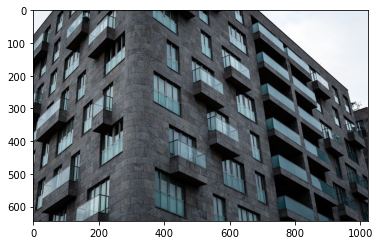

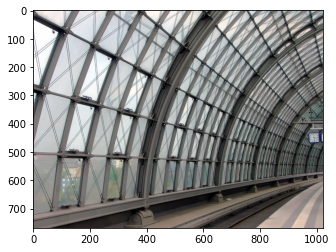

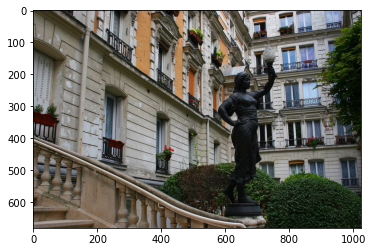

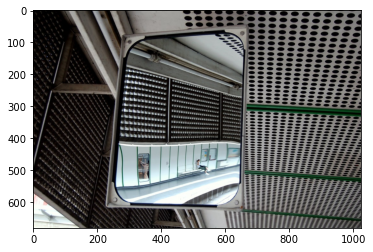

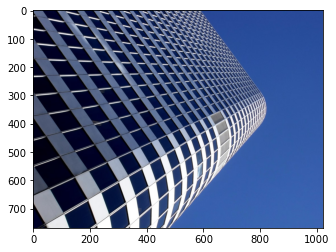

...

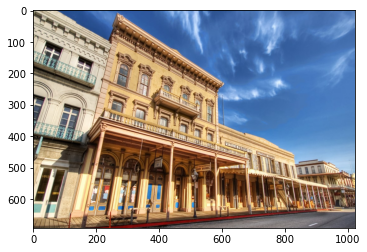

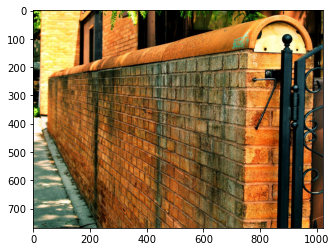

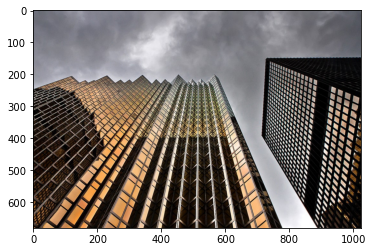

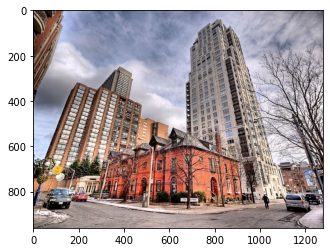

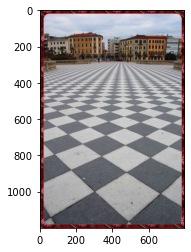

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (21,) + inhomogeneous part.

In [ ]:
dataset_path=r'C:\Users\Ravi Kiran\Downloads\png2jpg (1)' #creating an object for path directory
dataset=[]                                               # creating an empty list
for filename in os.listdir(dataset_path):                 # iterating throuugh all the images using for loop
    
    
    img=plt.imread(os.path.join(dataset_path,filename))    # reading the image using matplotlib
    image=np.zeros([img.shape[0],img.shape[1],img.shape[2]],dtype='uint8') # created ana empty numpy array of image size
    image[:,:,0]=img[:,:,0]  # assigning to  channel1 corresponding image channel
    image[:,:,1]=img[:,:,1]   # assigning to  channel2 corresponding image channel
    image[:,:,2]=img[:,:,2] # assigning to  channel3 corresponding image channel
    plt.imshow(image)
    plt.show()
    dataset.append(image)   #appending each image to my list
    
y_train=np.array(dataset,dtype='uint8')

      

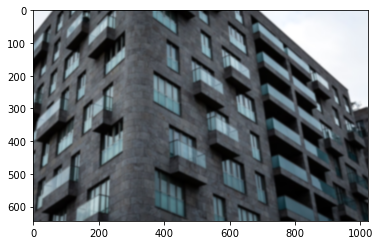

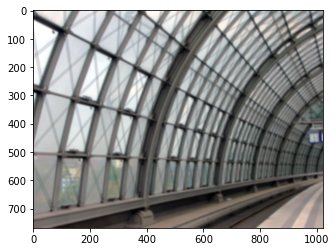

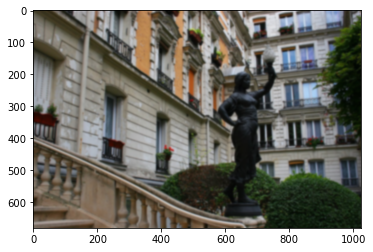

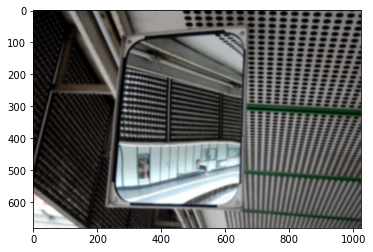

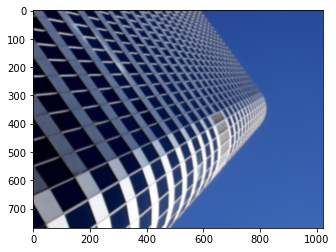

...

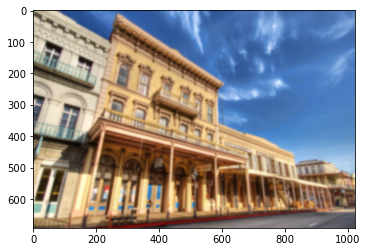

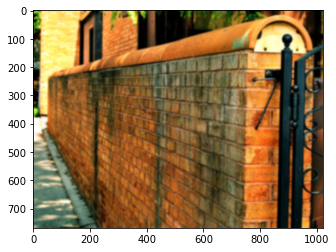

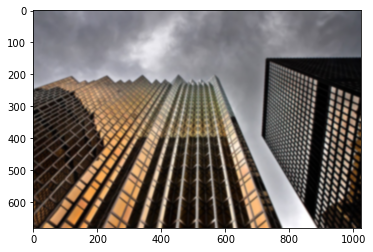

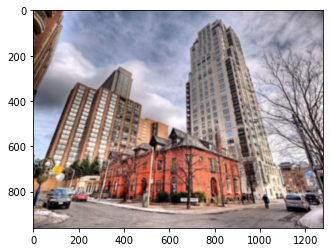

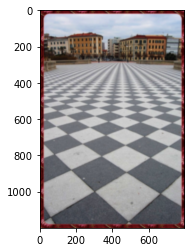

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (21,) + inhomogeneous part.

In [ ]:
W=13
dataset1=[] 
for image in dataset:
    h,w,c=image.shape
    near_img=cv2.GaussianBlur(image, (W, W),0)   
    dataset1.append(near_img)
    #print(near_img.shape)
    plt.imshow(near_img)
    plt.show()
x_train=np.array(dataset1,dtype='uint8') 

In [ ]:
model = Sequential()    
model.add(Conv2D(32,(5,5),activation='relu',kernel_initializer='glorot_uniform',padding='same', use_bias=True,input_shape=(None,None,3)))  
model.add(Conv2D(32, (3,3),activation='relu',kernel_initializer='glorot_uniform',padding='same', use_bias=True))
model.add(Conv2D(32, (3,3),activation='relu',kernel_initializer='glorot_uniform',padding='same', use_bias=True))
model.add(Conv2D(32, (3,3),activation='relu',kernel_initializer='glorot_uniform',padding='same', use_bias=True))
model.add(Conv2D(32, (3,3),activation='relu',kernel_initializer='glorot_uniform',padding='same', use_bias=True))
model.add(Conv2D(3, (5,5),activation='linear',kernel_initializer='glorot_uniform',padding='same', use_bias=True))
model.build()

In [ ]:
adam= Adam(lr=3e-4) # intializing the stochastic gradient descent and learning rate as fast 
model.compile(                      # compiling my model with a loss of mean square error
    optimizer=adam,
    loss='mae',metrics=['accuracy'])

In [ ]:
history=model.fit(x_train, y_train,                       # training my model with input as patches and output as central pixels
          batch_size=15,epochs=10) 

Epoch 1/10
9/9 [==============================] - 94s 10s/step - loss: 12.7269 - accuracy: 0.8430
Epoch 2/10
9/9 [==============================] - 98s 11s/step - loss: 12.4134 - accuracy: 0.8456
Epoch 3/10
9/9 [==============================] - 92s 10s/step - loss: 12.4859 - accuracy: 0.8608
Epoch 4/10
9/9 [==============================] - 93s 10s/step - loss: 12.4271 - accuracy: 0.8494
Epoch 5/10
9/9 [==============================] - 91s 10s/step - loss: 12.2649 - accuracy: 0.8297
Epoch 6/10
9/9 [==============================] - 86s 10s/step - loss: 11.3535 - accuracy: 0.8738
Epoch 7/10
9/9 [==============================] - 85s 9s/step - loss: 11.4626 - accuracy: 0.8734
Epoch 8/10
9/9 [==============================] - 87s 10s/step - loss: 11.4075 - accuracy: 0.8616
Epoch 9/10
9/9 [==============================] - 90s 10s/step - loss: 11.5915 - accuracy: 0.8684
Epoch 10/10
9/9 [==============================] - 86s 10s/step - loss: 11.2149 - accuracy: 0.8720


In [ ]:
score = model.evaluate(x_train, y_train, batch_size=15)

9/9 [==============================] - 12s 1s/step - loss: 10.5557 - accuracy: 0.8817


In [ ]:
score

[10.55572509765625, 0.8816824555397034]

No handles with labels found to put in legend.


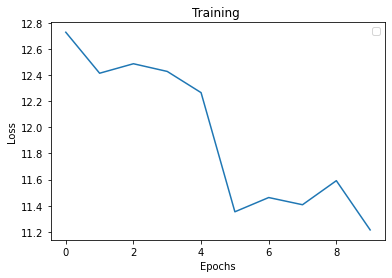

In [ ]:
plt.plot(history.history['loss'])
plt.title('Training ')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

No handles with labels found to put in legend.


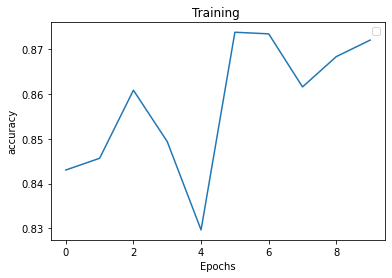

In [ ]:

plt.plot(history.history['accuracy'])
plt.title('Training ')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

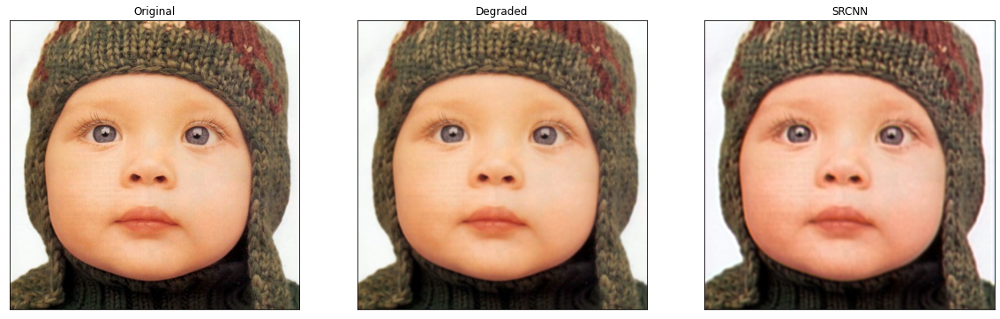

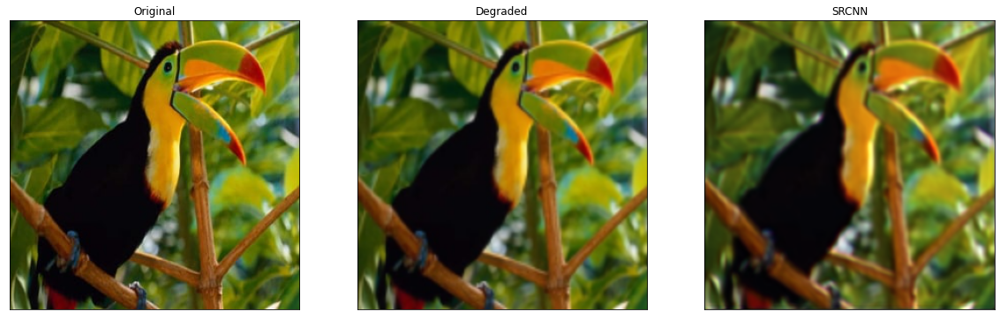

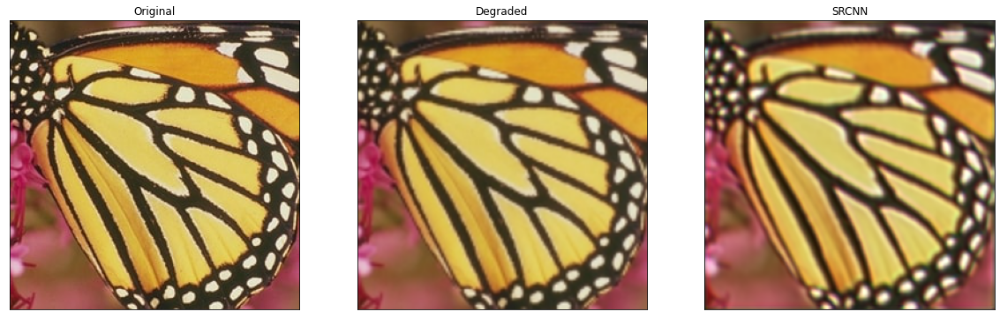

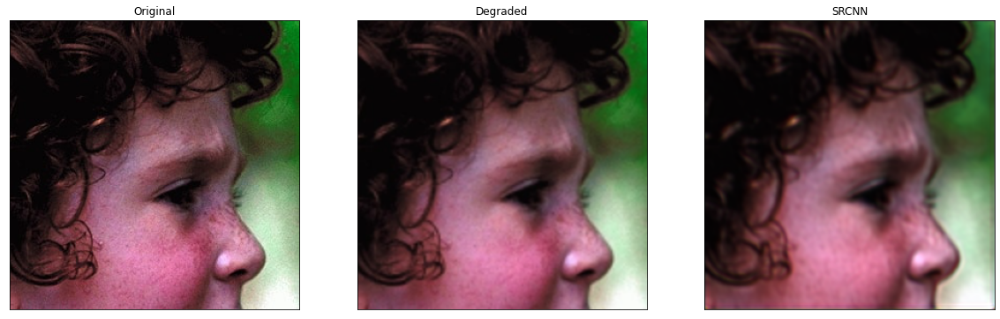

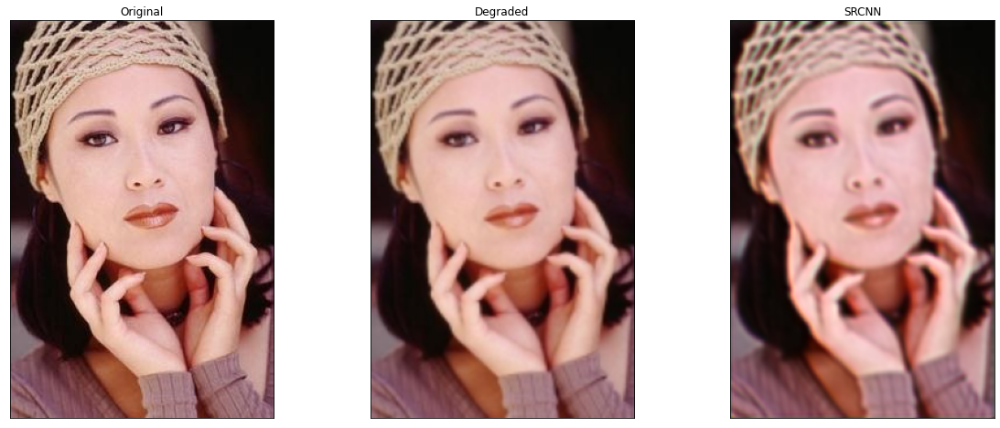

In [ ]:
test_image_path=r'C:\Users\Ravi Kiran\Documents\test'

for filename in os.listdir(test_image_path):
    img=plt.imread(os.path.join(test_image_path,filename))  
    h,w,c= img.shape    
    
    near_img = cv2.resize(img, (w//2,h//2), interpolation =cv2.INTER_LINEAR)  
    l_img = cv2.resize(near_img, (w, h), interpolation =cv2.INTER_LINEAR)
    
    my_image=tf.reshape(l_img,[-1,l_img.shape[0],l_img.shape[1],3]) 
    y=model.predict(my_image)
    y=np.reshape(y,(h,w,3))
    
    y[y[:] > 255] = 255
    y[y[:] < 0] = 0
    y=y.astype(np.uint8)
    fig, axs = plt.subplots(1, 3, figsize=(20, 8))
    axs[0].imshow(img)
    axs[0].set_title('Original')
    axs[1].imshow(l_img)
    axs[1].set_title('Degraded')
    axs[2].imshow(y)
    axs[2].set_title('SRCNN')

    # remove the x and y ticks
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])